<a href="https://colab.research.google.com/github/Stuchkov/multiclass_gas_classification/blob/main/multiclass_gas_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Условия

1. Это должна быть задача классического машинного обучения.
2. Использовать можно любой публичный датасет.

# Описание задачи и хода решения
Решается задача мультиклассовой классификации: в исследовании [1] авторы собрали несколько датасетов с временными рядами показаний 16-ти датчиков, размещённых в камере, куда поступал какой-либо газ либо их смесь. Для данной задачи был выбран датасет ethylene_CO.txt, где на протяжении ~11.6 часов (4208262 строки с частотой 100 Гц) менялся газовый состав камеры между четырьмя состояниями: отсутствие газа, наличие этилена, наличие CO, смесь обоих. Датасет и его описание находятся в открытом доступе (https://www.kaggle.com/datasets/uciml/gas-sensor-array-under-dynamic-gas-mixtures?select=ethylene_CO.txt)
<br><br>

**1)** Проведена предобработка датасета: наименованы все столбцы, просвоены метки (0 - нет газа, 1 - только этилен, 2 - только CO, 3 - смесь газов), удалены столбцы наличия газов для избежания утечки данных.
<br><br>

**2)** Проанализированы графики показаний датчиков: на первых секундах были выявлены экстремальные или околонулевые значения, свидетельствующие о пребывании датчиков в установившемся режиме после включения. Чтобы исключить влияние этих данных на обучение, обрезаны первые 20 секунд.
<br><br>

**3)** Датасет разделён на обучающую и тестовую выборки, где тестовая - это последние 30% датасета (модель должна предсказывать события на будущих данных). Формируются окна, размер которых зависит от времени реагирования и времени восстановления датчиков. Далее каждому окну присваивается либо чистый класс (0,1,2,3), либо переходный — (1->2, 0->3, 2->0 и т.д.) для того, чтобы модель могла распознавать эти переходные состояния. Окна формируются с перекрытием 80%, что позволяет увеличить количество обучающих примеров и захватить больше информации о переходных процессах.
<br><br>

**4)** Извлечены признаки из каждого окна, проведена кросс-валидация, обучена модель RandomForestClassifier. Оценена точность, сделаны выводы.
<br><br>

Источники
1.	 Fonollosa, J., Sheik, S., Huerta, R., & Marco, S. (2015). Reservoir computing compensates slow response of chemosensor arrays exposed to fast varying gas concentrations in continuous monitoring Sensors and Actuators B: Chemical, 215, 618–629. doi:10.1016/j.snb.2015.03.028

# Загрузка датасета
*Время выполнения ~30 секунд*

Датасет находится в открытом доступе в kaggle: https://www.kaggle.com/datasets/uciml/gas-sensor-array-under-dynamic-gas-mixtures?select=ethylene_CO.txt, однако чтобы не загружать каждый раз свой *kaggle.json* в Colab при открытии новой сессии и не настраивать kaggle API, датасет заранее скачан и сохранён в Google Drive.

In [ ]:
# Устанавливаем gdown
!pip install -q gdown

# Скачиваем файл по ID
!gdown 1DvaCuhkQUxJY7N5lnqwnOwHCRdZp6ket

# Распаковываем
!unzip -q ethylene_CO.txt.zip -d /content

# Проверяем содержимое
!ls /content

Downloading...
From (original): https://drive.google.com/uc?id=1DvaCuhkQUxJY7N5lnqwnOwHCRdZp6ket
From (redirected): https://drive.google.com/uc?id=1DvaCuhkQUxJY7N5lnqwnOwHCRdZp6ket&confirm=t&uuid=7d6f5ac9-a151-4a47-b3a9-425e70ee5069
To: /content/ethylene_CO.txt.zip
100% 191M/191M [00:03<00:00, 59.4MB/s]
ethylene_CO.txt      roc_кривая.png  матрица_ошибок.png
ethylene_CO.txt.zip  sample_data


# Предобработка данных
*Время выполнения ~30 cекунд*

In [ ]:
import pandas as pd
import numpy as np

with open('ethylene_CO.txt', 'r') as f:
    header = f.readline().strip().split(', ')

# Присваиванием имена столбцам (в оригинальном файле их не было)
sensor_order = ['TGS2602', 'TGS2602', 'TGS2600', 'TGS2600',
                'TGS2610', 'TGS2610', 'TGS2620', 'TGS2620',
                'TGS2602', 'TGS2602', 'TGS2600', 'TGS2600',
                'TGS2610', 'TGS2610', 'TGS2620', 'TGS2620']

column_names = header[:3] + [f'Sensor{i}_{sensor}' for i, sensor in enumerate(sensor_order, 1)]

# Создание меток и вывод строк с разными метками
df_co = pd.read_csv('ethylene_CO.txt',
                    delimiter='\s+',
                    skiprows=1,
                    header=None,
                    names=column_names)

# Векторизированное присвоение меток
df_co['label'] = 0  # по умолчанию: нет газа
df_co.loc[(df_co['Ethylene conc (ppm)'] > 0) & (df_co['CO conc (ppm)'] == 0), 'label'] = 1  # только Ethylene
df_co.loc[(df_co['Ethylene conc (ppm)'] == 0) & (df_co['CO conc (ppm)'] > 0), 'label'] = 2  # только CO
df_co.loc[(df_co['Ethylene conc (ppm)'] > 0) & (df_co['CO conc (ppm)'] > 0), 'label'] = 3  # смесь

# Выборка по меткам для демонстрации
examples = pd.concat([
    df_co[df_co['label'] == 0].head(1),
    df_co[df_co['label'] == 1].head(1),
    df_co[df_co['label'] == 2].head(1),
    df_co[df_co['label'] == 3].head(1),
])

# Вывод
print("Столбцы в DataFrame:", df_co.columns.tolist())
print("\nПример по одному для каждого значения label (0–3):")
print(examples[['Time (seconds)', 'CO conc (ppm)', 'Ethylene conc (ppm)', 'label']])

# Удаляем столбцы с концентрациями и временем сразу после создания меток
columns_to_drop = ['Time (seconds)', 'CO conc (ppm)', 'Ethylene conc (ppm)']
df_co = df_co.drop(columns=columns_to_drop, errors='ignore')
print(f"- Используемые столбцы: {df_co.columns.tolist()}")

# Получаем колонки датчиков
sensor_columns = [col for col in df_co.columns if 'Sensor' in col]
print(f"- Столбцы датчиков: {sensor_columns}")

Столбцы в DataFrame: ['Time (seconds)', 'CO conc (ppm)', 'Ethylene conc (ppm)', 'Sensor1_TGS2602', 'Sensor2_TGS2602', 'Sensor3_TGS2600', 'Sensor4_TGS2600', 'Sensor5_TGS2610', 'Sensor6_TGS2610', 'Sensor7_TGS2620', 'Sensor8_TGS2620', 'Sensor9_TGS2602', 'Sensor10_TGS2602', 'Sensor11_TGS2600', 'Sensor12_TGS2600', 'Sensor13_TGS2610', 'Sensor14_TGS2610', 'Sensor15_TGS2620', 'Sensor16_TGS2620', 'label']

Пример по одному для каждого значения label (0–3):
        Time (seconds)  CO conc (ppm)  Ethylene conc (ppm)  label
0                 0.00           0.00                 0.00      0
19995           200.01           0.00                16.67      1
9995            100.01         533.33                 0.00      2
398095         3981.01         253.33                 6.67      3
- Используемые столбцы: ['Sensor1_TGS2602', 'Sensor2_TGS2602', 'Sensor3_TGS2600', 'Sensor4_TGS2600', 'Sensor5_TGS2610', 'Sensor6_TGS2610', 'Sensor7_TGS2620', 'Sensor8_TGS2620', 'Sensor9_TGS2602', 'Sensor10_TGS2602', 'S

# Визуализация датасета
*Время выполнения: ~2-3 минуты*

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Верхний график с истинными метками, 16 графиков данных с датчиков
# Фактор уменьшения частоты для более быстрой отрисовки: 100

def plot_all_sensors_separately(df, downsample_factor=100, class_names=None):

    df_downsampled = df.iloc[::downsample_factor].copy()
    df_downsampled['Время'] = df_downsampled.index # Создаем временную ось на основе индекса

    # Список всех датчиков
    sensor_features = [col for col in df_downsampled.columns if 'Sensor' in col]
    num_sensors = len(sensor_features)

    # Создаём подграфики: 1 для меток + num_sensors для датчиков
    fig = make_subplots(rows=num_sensors + 1, cols=1,
                        shared_xaxes=True,
                        vertical_spacing=0.01,
                        subplot_titles=['Истинные метки'] + [f'Показания {s}' for s in sensor_features])

    # График 1 (верхний): Истинные метки
    fig.add_trace(go.Scatter(
        x=df_downsampled['Время'],
        y=df_downsampled['label'],
        mode='lines',
        line=dict(color='orange', width=1, shape='hv'),
        hovertemplate='Время: %{x}<br>Истинная метка: %{y}<extra></extra>'
    ), row=1, col=1)

    # График для каждого датчика
    for i, feature_name in enumerate(sensor_features):
        fig.add_trace(go.Scatter(
            x=df_downsampled['Время'],
            y=df_downsampled[feature_name],
            mode='lines',
            line=dict(color='black', width=1),
            hovertemplate='Время: %{x}<br>Показание: %{y}<extra></extra>'
        ), row=i + 2, col=1)

    # Настройка осей и заголовков
    fig.update_layout(
        title_text='Визуализация истинных меток и данных с датчиков',
        height=200 * (num_sensors + 1),
        showlegend=False,
    )

    if class_names:
        tickvals = list(range(len(class_names)))
        ticktext = class_names
    else:
        tickvals = list(np.unique(df_downsampled['label'].dropna()))
        ticktext = [str(val) for val in tickvals]

    fig.update_yaxes(
        title_text='Метка', row=1, col=1,
        tickmode='array',
        tickvals=tickvals,
        ticktext=ticktext
    )

    # Настройка заголовков для осей Y сенсоров
    for i, feature_name in enumerate(sensor_features):
        fig.update_yaxes(title_text=f'{feature_name}', row=i + 2, col=1)

    fig.show()

class_names = ['Нет газа', 'Ethylene', 'CO', 'Смесь']
plot_all_sensors_separately(
    df=df_co,
    downsample_factor=100,
    class_names=class_names
)

# Коррекция датасета исходя из анализа графиков
*Время выполнения: 1-2 секунды*

Из графиков видно, что в начале датчики находятся в переходном процессе (периоде установления) после включения. Особенно это видно на показаниях датчиков 9, 10, 13, 14, где в момент старта показания на порядок больше чем на всём остальном графике.
В качестве времени прекращения переходного процесса выбрана отметка 2000 (20 секунд), на датчиках 1-8 видно, что после этого времени значения входят в нормальный диапазон.

Показания из периода установления создадут перекос в обучении, что приведёт к искажённой модели. Поэтому весь датасет будет обрезан по отметке 20 с.

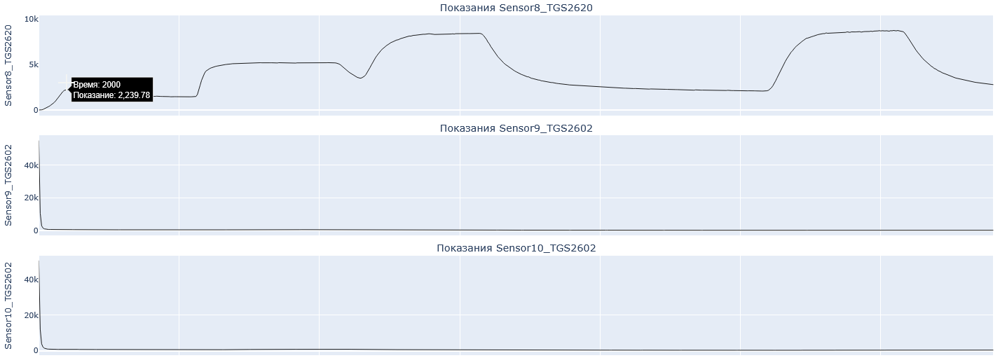

In [ ]:
# Определяем количество строк для удаления
rows_to_remove = 2000  # 20 секунд (частота 100 Гц)

print(f"Исходный размер датасета: {len(df_co)} строк")

# Создаем новый DataFrame, исключая первые N строк
df_co = df_co.iloc[rows_to_remove:].copy()

print(f"Размер очищенного датасета: {len(df_co)} строк")

Исходный размер датасета: 4208261 строк
Размер очищенного датасета: 4206261 строк


# Разделение датасета на выборки и создание окон с учётом временных задержек
*Время выполнения ~15 секунд*
<br><br>

Исходный датасет делится на два непрерывных блока:
- Тестовый блок: последние 30% данных используются для создания тестовой выборки. Это имитирует реальную ситуацию, когда модель должна предсказывать события на будущих, совершенно новых данных.
- Обучающий/валидационный блок: первые 70% данных используются для создания обучающей и валидационной выборок.
<br><br>

Затем из этих блоков создаются окна — фиксированные по длине фрагменты временного ряда. Размер окна определяется исходя из response time и recovery time:
- response_time: время достижения 90% от финального значения при появлении газа, ≈30 секунд для используемых здесь датчиков
- recovery_time: время возврата к базовой линии (отсутствию газа) после исчезновения, от 30 до 60 секунд для используемых здесь датчиков. В коде выбрано значение 30 секунд с целью создания большего количества разных окон (размер окна: response_time + recovery_time = 60 секунд).
*Источники:\
[TGS2600](https://asset.conrad.com/media10/add/160267/c1/-/en/000183304DS01/datenblatt-183304-figaro-gas-sensor-tgs-2600-o-x-h-92-mm-x-78-mm.pdf) — техническая информация производителя, страница 7, раздел 2-4 (Gas response)\
[TGS2602](https://www.figaro.co.jp/en/product/docs/tgs2602_technical%20information%28en%29_rev07.pdf) — техническая информация производителя, страница 6, раздел 2-4 (Gas response)\
[TGS2610](https://www.figarosensor.com/product/docs/TGS2610_Technical%20Infomation_rev01.pdf) — техническая информация производителя, страница 7, раздел 2-5 (Gas response)\
[TGS2620](https://www.elec.ru/viewer?url=/files/2014/10/03/Serija-TGS-2620.pdf) — техническая информация производителя, страница 7, раздел 2-5 (Gas response)
<br>

Окна создаются с 80%-ным перекрытием (подобрано экспериментально), что позволяет увеличить количество обучающих примеров и захватить больше информации о переходных процессах.
<br><br>

Каждому окну присваивается метка (класс). Если в окне преобладает один класс (более 95% записей), оно получает метку этого класса. Если же в окне происходит смена классов, например, начинается с класса '0', а заканчивается классом '1', оно получает специальную метку-переход ('0->1'). Таким образом модель сможет распознавать не только стабильные состояния, но и переходы между ними.
<br><br>

In [ ]:
from collections import Counter
from sklearn.model_selection import train_test_split

# Константы
SAMPLING_RATE_HZ = 100 # частота
SENSOR_RESPONSE_TIME_SEC = 30 # время реагирования датчика
SENSOR_RECOVERY_TIME_SEC = 30 # время восстановаления датчика
WINDOW_LEN_SEC = SENSOR_RESPONSE_TIME_SEC + SENSOR_RECOVERY_TIME_SEC # размер окна в секундах
WINDOW_SIZE = WINDOW_LEN_SEC * SAMPLING_RATE_HZ # размер окна в строках
STEP_SIZE = int(WINDOW_SIZE * (1 - 0.8)) # перекрытие окон 80%
LABEL_THRESHOLD = 0.95 # порог (процент меток одного класса), ниже которого окно считается переходным
VAL_SPLIT_RATIO = 0.2 # 20% от выборки train в выборку validation

print(f"Параметры окон:")
print(f"- Размер окна: {WINDOW_SIZE} строк ({WINDOW_LEN_SEC} сек)")
print(f"- Шаг: {STEP_SIZE} строк (перекрытие 50%)")
print(f"- Всего строк в датасете: {len(df_co):,}")

def create_windows_from_range(df, start_idx, end_idx, step_size, label_threshold=0.95):
    """
    Создаёт окна на временном ряду с метками.
    """
    sensor_columns = [col for col in df.columns if 'Sensor' in col]
    windowed_data = []
    windowed_labels = []
    window_info = []

    actual_end = min(end_idx, len(df))
    total_windows = 0
    count_main = 0
    count_transitions = 0

    for start in range(start_idx, actual_end - WINDOW_SIZE + 1, step_size):
        end = start + WINDOW_SIZE
        if end > actual_end:
            break

        total_windows += 1
        window = df.iloc[start:end]
        sensor_data = window[sensor_columns].values.astype(np.float32)
        label_counts = Counter(window['label'])
        most_common_label, most_common_count = label_counts.most_common(1)[0]

        if most_common_count / WINDOW_SIZE >= label_threshold:
            label = most_common_label
            count_main += 1
        else:
            start_label = window['label'].iloc[0]
            end_label = window['label'].iloc[-1]

            if start_label == end_label:
                label = start_label
                count_main += 1
            else:
                label = f"{start_label}->{end_label}"
                count_transitions += 1

        windowed_data.append(sensor_data)
        windowed_labels.append(label)
        window_info.append({'start': start, 'end': end, 'label': label})

    print(f"- Всего возможных окон: {total_windows:,}")
    print(f"- Чистых окон (≥ {label_threshold*100:.0f}% одного класса): {count_main:,}")
    print(f"- Переходных окон: {count_transitions:,}")
    if total_windows > 0:
        print(f"- Процент переходных: {count_transitions / total_windows * 100:.2f}%")

    return windowed_data, windowed_labels, window_info

print("\n" + "="*60)
print("БЛОЧНОЕ РАЗДЕЛЕНИЕ ДАННЫХ")
print("="*60)

total_len = len(df_co)
test_start_idx = int(total_len * 0.7)
train_end_idx = test_start_idx

print(f"Разделение данных:")
print(f"- Для обучения/валидации: строки 0 - {train_end_idx:,}")
print(f"- Для тестирования: строки {test_start_idx:,} - {total_len:,}")

print(f"\n=== Создание тестовой выборки ===")
df_test_raw = df_co.iloc[test_start_idx:].copy().reset_index(drop=True)
test_step = STEP_SIZE // 2 if STEP_SIZE > 1 else 1
print(f"Создаем тестовые окна с шагом {test_step}...")
test_windows, test_labels, _ = create_windows_from_range(
    df_test_raw, 0, len(df_test_raw), test_step, label_threshold=LABEL_THRESHOLD
)
X_test = np.stack(test_windows)
y_test = np.array(test_labels)

# Добавлен вывод количества классов для тестовой выборки
print("\n" + "-"*30)
print("Распределение классов в тестовой выборке:")
print(pd.Series(y_test).value_counts().sort_index())
print("-" * 30)

print(f"\n=== Создание обучающей выборки ===")
df_train_raw = df_co.iloc[:train_end_idx].copy()
print(f"Создаем обучающие окна с шагом {STEP_SIZE}...")
train_windows, train_labels, _ = create_windows_from_range(
    df_train_raw, 0, len(df_train_raw), STEP_SIZE, label_threshold=LABEL_THRESHOLD
)
X_train_raw = np.stack(train_windows)
y_train_raw = np.array(train_labels)

# Добавлен вывод количества классов для обучающей выборки
print("\n" + "-"*30)
print("Распределение классов в обучающей выборке:")
print(pd.Series(y_train_raw).value_counts().sort_index())
print("-" * 30)

Параметры окон:
- Размер окна: 6000 строк (60 сек)
- Шаг: 1199 строк (перекрытие 50%)
- Всего строк в датасете: 4,206,261

БЛОЧНОЕ РАЗДЕЛЕНИЕ ДАННЫХ
Разделение данных:
- Для обучения/валидации: строки 0 - 2,944,382
- Для тестирования: строки 2,944,382 - 4,206,261

=== Создание тестовой выборки ===
Создаем тестовые окна с шагом 599...
- Всего возможных окон: 2,097
- Чистых окон (≥ 95% одного класса): 1,360
- Переходных окон: 737
- Процент переходных: 35.15%

------------------------------
Распределение классов в тестовой выборке:
0       398
0->1    132
0->2    116
0->3      6
1       513
1->0    126
1->2      9
1->3     86
2       253
2->0    119
2->1      2
2->3     24
3       196
3->0      7
3->1     89
3->2     21
Name: count, dtype: int64
------------------------------

=== Создание обучающей выборки ===
Создаем обучающие окна с шагом 1199...
- Всего возможных окон: 2,451
- Чистых окон (≥ 95% одного класса): 1,558
- Переходных окон: 893
- Процент переходных: 36.43%

---------------

# Визуализация обучающих окон с метками
*Время выполнения ~10 секунд*

- Всего возможных окон: 2,451
- Чистых окон (≥ 95% одного класса): 1,558
- Переходных окон: 893
- Процент переходных: 36.43%


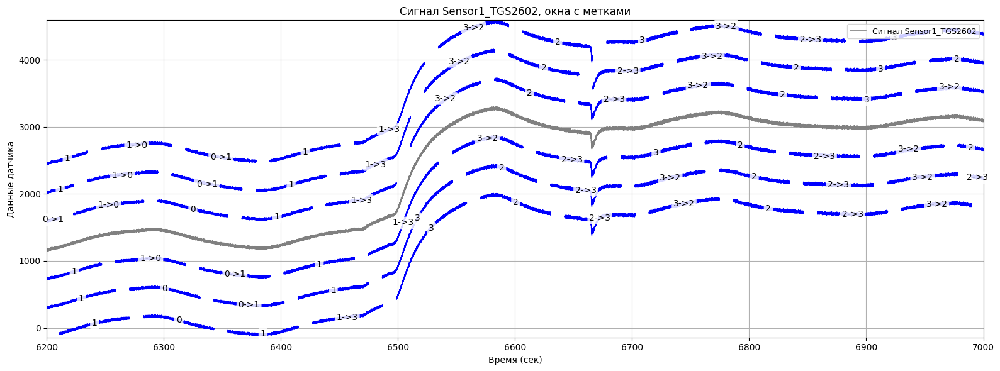

In [ ]:
import matplotlib.pyplot as plt

time_start_sec = 6200 # левая граница графика
time_end_sec = 7000 # правая граница графика
n_windows_to_plot = 80 # количество окон

sensor_col = [col for col in df_co.columns if 'Sensor' in col][0]
signal = df_co[sensor_col].values
time = np.arange(len(signal)) / SAMPLING_RATE_HZ

time_mask = (time >= time_start_sec) & (time <= time_end_sec)
time_limited = time[time_mask]
signal_limited = signal[time_mask]

# --- Выделение окон из обучающего набора для визуализации ---
# Используем ту же функцию, что и раньше, но не сохраняем все данные, только информацию об окнах
train_windows, train_labels, train_info_new = create_windows_from_range(
    df_train_raw, 0, len(df_train_raw), STEP_SIZE, label_threshold=LABEL_THRESHOLD
)

# фильтрация окон
windows_in_range = []
for w in train_info_new:
    win_start_sec = w['start'] / SAMPLING_RATE_HZ
    win_end_sec = w['end'] / SAMPLING_RATE_HZ
    # Проверяем пересечение окна с диапазоном времени
    if win_end_sec >= time_start_sec and win_start_sec <= time_end_sec:
        windows_in_range.append(w)

windows_to_plot = windows_in_range[:n_windows_to_plot]

# --- График ---
plt.figure(figsize=(16, 6))

# 1. График сигнала
plt.plot(time_limited, signal_limited, color='gray', linewidth=1.2, label='Сигнал')

# Определим масштаб для смещения окон
if len(signal_limited) > 0:
    ymin = np.min(signal_limited)
    ymax = np.max(signal_limited)
    signal_range = ymax - ymin
    base_shift = 0.2 * signal_range
    ylim_lower = ymin - 3 * base_shift
    ylim_upper = ymax + 3 * base_shift
    plt.ylim(ylim_lower, ylim_upper)
else:
    # Задаем стандартные границы, если сигнал пустой
    plt.ylim(0, 1)
    base_shift = 0.2

# 2. Отрисовка окон с подписью
group_size = 6

for i, win in enumerate(windows_to_plot):
    start_idx_df_raw = win['start']
    end_idx_df_raw = win['end']

    # Индексы относительно всего исходного датасета
    start_idx_df_co = start_idx_df_raw
    end_idx_df_co = end_idx_df_raw

    # Проверяем, чтобы индексы не выходили за пределы df_co
    if end_idx_df_co > len(signal):
        continue

    win_time = time[start_idx_df_co:end_idx_df_co]
    win_signal = signal[start_idx_df_co:end_idx_df_co]

    # Применим маску ограничения по времени
    mask = (win_time >= time_start_sec) & (win_time <= time_end_sec)
    if not any(mask):
        continue

    pos_in_group = i % group_size
    if pos_in_group < 3:
        level = pos_in_group
        shift = base_shift * (level + 1)
    else:
        level = pos_in_group - 3
        shift = -base_shift * (level + 1)

    shifted_signal = win_signal[mask] + shift

    # Отрисовка окна
    plt.plot(win_time[mask], shifted_signal, color='blue', linewidth=1)

    # Находим индекс середины сдвинутого сигнала
    mid_index = len(win_time[mask]) // 2

    # Определяем координаты для текста
    text_x = win_time[mask][mid_index]
    text_y = shifted_signal[mid_index]

    # Отрисовка подписи прямо на линии окна
    plt.text(text_x, text_y, win["label"],
             ha='center', va='center',
             fontsize=10, color='black',
             bbox=dict(facecolor='white', alpha=0.85, edgecolor='none', boxstyle='round,pad=0.2'))

# Оформление
plt.title(f'Сигнал {sensor_col}, окна с метками')
plt.xlabel('Время (сек)')
plt.ylabel('Данные датчика')
plt.xlim(time_start_sec, time_end_sec)
plt.grid(True)
plt.legend([f'Сигнал {sensor_col}'], loc='upper right', fontsize=9)
plt.tight_layout()
plt.show()

# Извлечение признаков и обучение модели
*Время выполнения ~30 секунд*

Извлекаем статистические признаки из каждого окна:
1. Минимальное значение
2. Максимальное значение
3. Среднее значение
4. Медианное значение
5. Стандартое отклонение
6. Размах (макс - мин)
7. Q1 (25% всех значений в окне меньше или равно этому значению)
8. Q3 (75% всех значений в окне меньше или равно этому значению)
9. Межквартильный размах (IQR): в отличие от полного размаха (max−min), IQR более устойчив к выбросам. Он показывает разброс центральной половины данных, игнорируя крайние значения.
10. Скорость изменения (производная)
11. Асимметрия (Skewness) - мера симметричности распределения значений сигнала относительно его среднего. Этот признак помогает определить, есть ли в данных частые, но небольшие аномалии в одну сторону (например, постоянные небольшие толчки) или редкие, но сильные.
12. Эксцесс (Kurtosis) - мера "остроты" пика распределения и "тяжести" его хвостов. Эксцесс помогает понять, насколько "кучно" расположены данные и есть ли в них много аномальных, далёких от среднего значений. Это может быть полезно для обнаружения импульсных событий или редких, но сильных изменений в сигнале.

Далее обучаем RandomForestClassifier и проверяем на валидационной и тестовой выборке.

In [ ]:
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import skew, kurtosis
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE

print("\n" + "="*60)
print("БЛОК ИЗВЛЕЧЕНИЯ ПРИЗНАКОВ, ОБУЧЕНИЯ И ТЕСТИРОВАНИЯ")
print("="*60)

def extract_advanced_features(windows):
    """
    Извлекает статистические признаки из каждого окна.
    """
    if len(windows) == 0:
        return np.array([])

    # Базовые статистики
    mean_features = np.mean(windows, axis=1)
    median_features = np.median(windows, axis=1)
    std_features = np.std(windows, axis=1)
    min_features = np.min(windows, axis=1)
    max_features = np.max(windows, axis=1)
    range_features = max_features - min_features

    # Квантили
    q1_features = np.quantile(windows, 0.25, axis=1)
    q3_features = np.quantile(windows, 0.75, axis=1)
    # Межквартильный размах (IQR)
    iqr_features = q3_features - q1_features

    # Скорость изменения сигнала (производная)
    diff_features = np.mean(np.abs(np.diff(windows, axis=1)), axis=1)

    # Асимметрия (Skewness)
    skew_features = skew(windows, axis=1)

    # Эксцесс (Kurtosis)
    kurtosis_features = kurtosis(windows, axis=1)

    # Объединяем все признаки в один массив
    features = np.hstack([
        mean_features,
        median_features,
        std_features,
        min_features,
        max_features,
        range_features,
        q1_features,
        q3_features,
        iqr_features,
        diff_features,
        skew_features,
        kurtosis_features
    ])

    # Если на входе был трёхмерный массив (N, W, 1),
    # на выходе получается двумерный массив (N, количество_признаков)
    if features.ndim > 2:
        return features.reshape(features.shape[0], -1)

    return features

def apply_selective_smote(X_features, y_labels, min_samples=2, max_samples=15, target_multiplier=3):
    """
    Применяет SMOTE только к классам с количеством образцов от min_samples до max_samples.
    min_samples: минимальное количество образцов для применения SMOTE
    max_samples: максимальное количество образцов для применения SMOTE
    target_multiplier: во сколько раз увеличивать малые классы
    """
    # Подсчитываем количество образцов в каждом классе
    class_counts = pd.Series(y_labels).value_counts()
    print(f"\nИсходное распределение классов:")
    for class_name, count in class_counts.sort_index().items():
        print(f"  {class_name}: {count}")

    # Определяем классы, которые нужно увеличить с помощью SMOTE
    classes_to_augment = []
    target_counts = {}

    # Вычисляем медианное количество образцов для более консервативного подхода
    median_count = int(class_counts.median())

    for class_name, count in class_counts.items():
        if min_samples <= count <= max_samples:
            classes_to_augment.append(class_name)
            # Увеличиваем в target_multiplier раз, но не больше медианы
            target_count = min(count * target_multiplier, median_count)
            target_counts[class_name] = max(target_count, max_samples + 5)

    if not classes_to_augment:
        print("Нет классов для применения SMOTE.")
        return X_features, y_labels

    print(f"\nКлассы для увеличения с помощью SMOTE: {classes_to_augment}")
    print("Целевые количества после SMOTE:")
    for class_name in classes_to_augment:
        print(f"  {class_name}: {class_counts[class_name]} -> {target_counts[class_name]}")

    # Создаем стратегию для SMOTE
    sampling_strategy = {}
    for class_name, count in class_counts.items():
        if class_name in classes_to_augment:
            sampling_strategy[class_name] = target_counts[class_name]
        else:
            sampling_strategy[class_name] = count

    try:
        # Определяем оптимальное количество соседей
        min_class_size = min([class_counts[c] for c in classes_to_augment])
        k_neighbors = min(3, max(1, min_class_size - 1))  # Уменьшаем k_neighbors

        print(f"Используем k_neighbors = {k_neighbors}")

        # Применяем SMOTE
        smote = SMOTE(
            random_state=42,
            sampling_strategy=sampling_strategy,
            k_neighbors=k_neighbors
        )
        X_resampled, y_resampled = smote.fit_resample(X_features, y_labels)

        # Выводим результат
        resampled_counts = pd.Series(y_resampled).value_counts()
        print(f"\nРаспределение классов после SMOTE:")
        for class_name, count in resampled_counts.sort_index().items():
            original_count = class_counts.get(class_name, 0)
            change = count - original_count
            print(f"  {class_name}: {count} (+{change})")

        print(f"\nОбщее количество образцов: {len(y_labels)} -> {len(y_resampled)}")

        return X_resampled, y_resampled

    except Exception as e:
        print(f"Ошибка при применении SMOTE: {e}")
        print("Попробуем более консервативный подход...")

        # Консервативный fallback - увеличиваем самые маленькие классы
        try:
            very_small_classes = [c for c in classes_to_augment if class_counts[c] <= 6]
            if very_small_classes:
                conservative_strategy = {}
                for class_name, count in class_counts.items():
                    if class_name in very_small_classes:
                        conservative_strategy[class_name] = max(count * 2, 12)
                    else:
                        conservative_strategy[class_name] = count

                smote_conservative = SMOTE(
                    random_state=42,
                    sampling_strategy=conservative_strategy,
                    k_neighbors=1
                )
                X_resampled, y_resampled = smote_conservative.fit_resample(X_features, y_labels)
                print("Применен консервативный SMOTE.")
                return X_resampled, y_resampled
        except Exception as e2:
            print(f"Консервативный SMOTE также не удался: {e2}")

        print("Возвращаем исходные данные.")
        return X_features, y_labels

# Шаг 1: Извлечение признаков для всего обучающего набора
print(f"\n=== Извлечение признаков ===")
X_train_full_features = extract_advanced_features(X_train_raw) # Используем весь сырой train
y_train_full = y_train_raw # Используем все сырые метки

X_test_features = extract_advanced_features(X_test)
print(f"Обучающая выборка после извлечения признаков: {X_train_full_features.shape}")
print(f"Тестовая выборка после извлечения признаков: {X_test_features.shape}")

# Шаг 2: Применение SMOTE для классов с малым количеством образцов
print("\n" + "="*60)
print("ПРИМЕНЕНИЕ SMOTE ДЛЯ БАЛАНСИРОВКИ КЛАССОВ")
print("="*60)

X_train_balanced, y_train_balanced = apply_selective_smote(
    X_train_full_features, y_train_full, min_samples=2, max_samples=15, target_multiplier=2
)

print("\n" + "="*60)
print("БЛОК ОБУЧЕНИЯ И ОЦЕНКИ С КРОСС-ВАЛИДАЦИЕЙ")
print("="*60)

# Шаг 3: Настройка кросс-валидации
n_splits = 5 # Количество фолдов
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Создаём список для хранения результатов
cv_scores = []
models = []

print(f"\n=== Обучение и оценка с помощью {n_splits}-фолдовой кросс-валидации ===")
# Цикл по фолдам
for fold, (train_index, val_index) in enumerate(skf.split(X_train_balanced, y_train_balanced), 1):
    print(f"Обучение фолда {fold}/{n_splits}...")

    # Разделение данных на обучающий и валидационный фолды
    X_train_fold, X_val_fold = X_train_balanced[train_index], X_train_balanced[val_index]
    y_train_fold, y_val_fold = y_train_balanced[train_index], y_train_balanced[val_index]

    # Создание и обучение модели на текущем фолде
    rf_model = RandomForestClassifier(
        n_estimators=50,
        max_depth=10,
        random_state=42,
        n_jobs=-1,
        class_weight='balanced'
    )

    rf_model.fit(X_train_fold, y_train_fold)
    models.append(rf_model) # Сохраняем модель каждого фолда

    # Оценка на валидационном фолде
    y_val_pred = rf_model.predict(X_val_fold)
    fold_accuracy = accuracy_score(y_val_fold, y_val_pred)
    cv_scores.append(fold_accuracy)
    print(f"  Точность фолда {fold}: {fold_accuracy:.4f}")

# Вывод итогов кросс-валидации
print("\n" + "-"*30)
print(f"Результаты кросс-валидации: {cv_scores}")
print(f"Средняя точность по кросс-валидации: {np.mean(cv_scores):.4f}")
print(f"Стандартное отклонение: {np.std(cv_scores):.4f}")

# Шаг 4: Обучение финальной модели на всех сбалансированных данных
print("\n=== Обучение финальной модели на всех сбалансированных обучающих данных ===")
final_model = RandomForestClassifier(
    n_estimators=50,
    max_depth=10,
    random_state=42,
    n_jobs=-1,
    class_weight='balanced'
)
final_model.fit(X_train_balanced, y_train_balanced)

# Шаг 5: Оценка на тестовой выборке с использованием финальной модели
print("\n=== Оценка на тестовой выборке ===")
y_test_pred = final_model.predict(X_test_features)
test_accuracy = accuracy_score(y_test, y_test_pred)
print(f"Итоговая точность (Final Accuracy): {test_accuracy:.4f}")
print("\nОтчет о классификации:")
print(classification_report(y_test, y_test_pred, zero_division=0))


БЛОК ИЗВЛЕЧЕНИЯ ПРИЗНАКОВ, ОБУЧЕНИЯ И ТЕСТИРОВАНИЯ

=== Извлечение признаков ===
Обучающая выборка после извлечения признаков: (2451, 192)
Тестовая выборка после извлечения признаков: (2097, 192)

ПРИМЕНЕНИЕ SMOTE ДЛЯ БАЛАНСИРОВКИ КЛАССОВ

Исходное распределение классов:
  0: 441
  0->1: 148
  0->2: 117
  0->3: 6
  1: 370
  1->0: 163
  1->2: 11
  1->3: 91
  2: 271
  2->0: 102
  2->1: 9
  2->3: 73
  3: 476
  3->1: 106
  3->2: 67

Классы для увеличения с помощью SMOTE: ['1->2', '2->1', '0->3']
Целевые количества после SMOTE:
  1->2: 11 -> 22
  2->1: 9 -> 20
  0->3: 6 -> 20
Используем k_neighbors = 3

Распределение классов после SMOTE:
  0: 441 (+0)
  0->1: 148 (+0)
  0->2: 117 (+0)
  0->3: 20 (+14)
  1: 370 (+0)
  1->0: 163 (+0)
  1->2: 22 (+11)
  1->3: 91 (+0)
  2: 271 (+0)
  2->0: 102 (+0)
  2->1: 20 (+11)
  2->3: 73 (+0)
  3: 476 (+0)
  3->1: 106 (+0)
  3->2: 67 (+0)

Общее количество образцов: 2451 -> 2487

БЛОК ОБУЧЕНИЯ И ОЦЕНКИ С КРОСС-ВАЛИДАЦИЕЙ

=== Обучение и оценка с помощью 5

# Выводы

Низкое стандартное отклонение на кросс-валидации указывает на то, что производительность модели не сильно колеблется от фолда к фолду. Это говорит о том, что модель устойчива и не зависит от конкретного разбиения данных.

Модель показала неплохой результат на чистых классах и на частых переходных классах. На редких переходных классах (0->3, 1->2, 2->1, 3->0) модель не смогла определить ни одно окно (в том числе с использованием SMOTE).

Возможные пути улучшения результата:
1. Более тонкая настройка параметров SMOTE и RandomForestClassifier.
2. Использование других моделей или ансамбля моделей.
3. Расширение количества признаков для каждого окна (автокорреляционные признаки, частотные признаки).